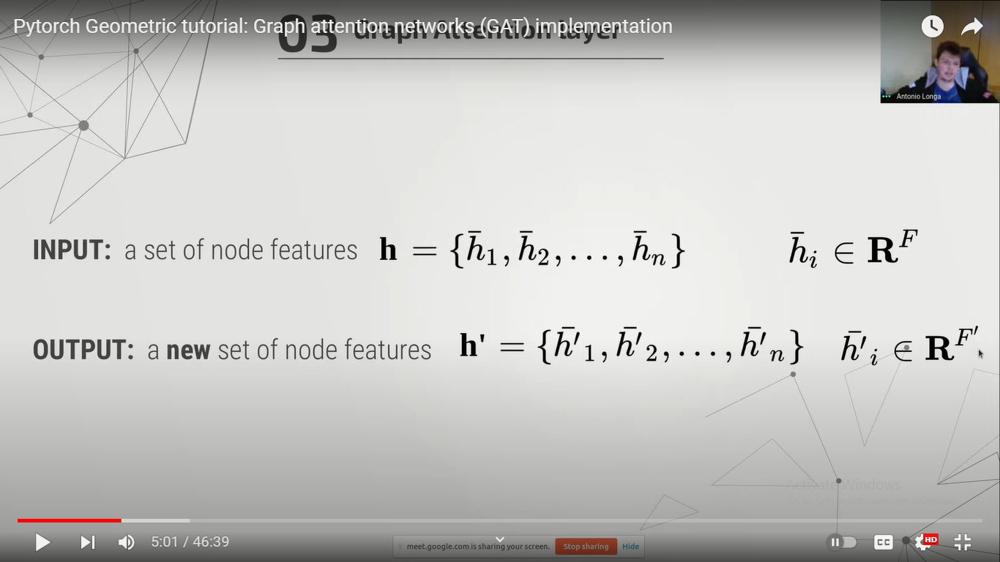

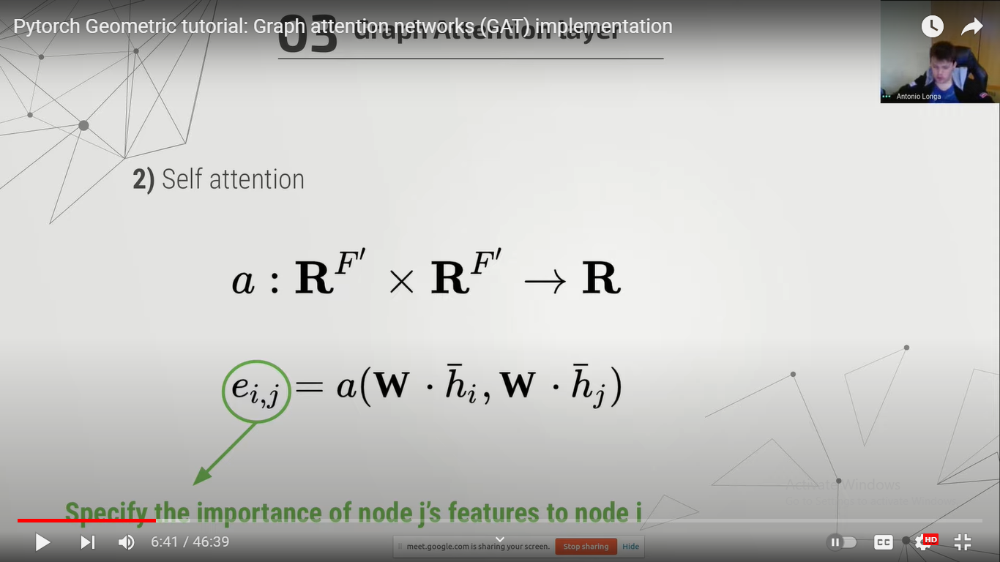

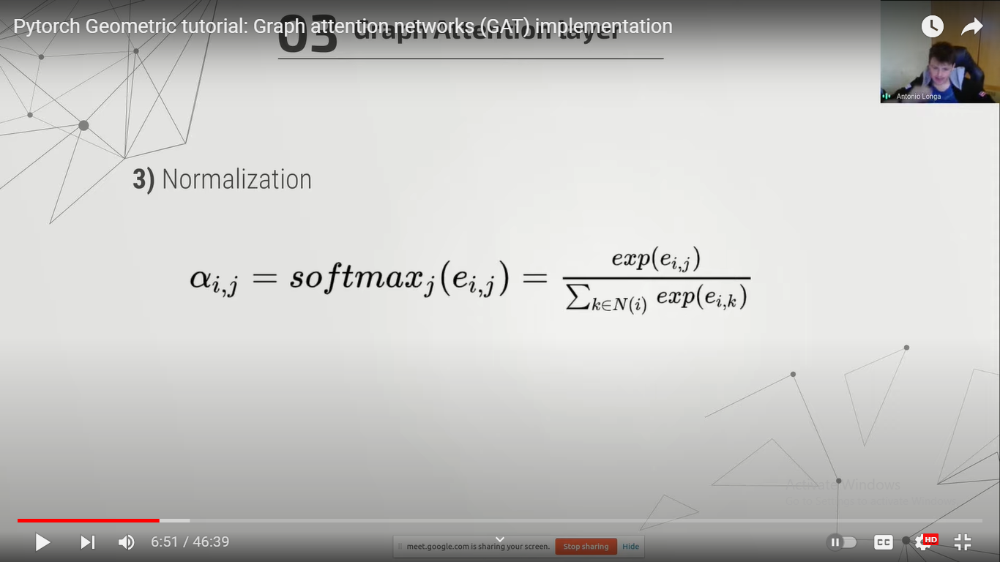

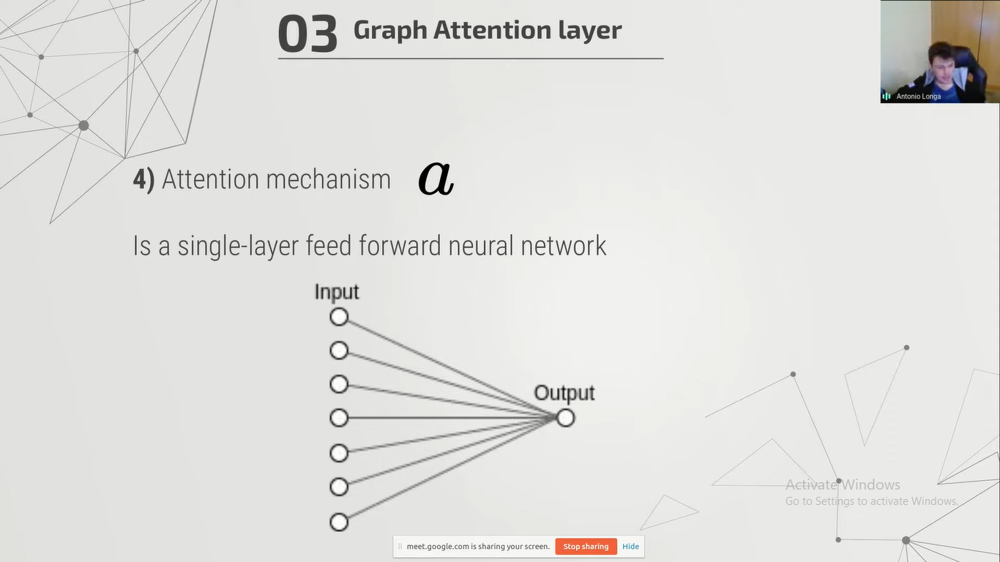

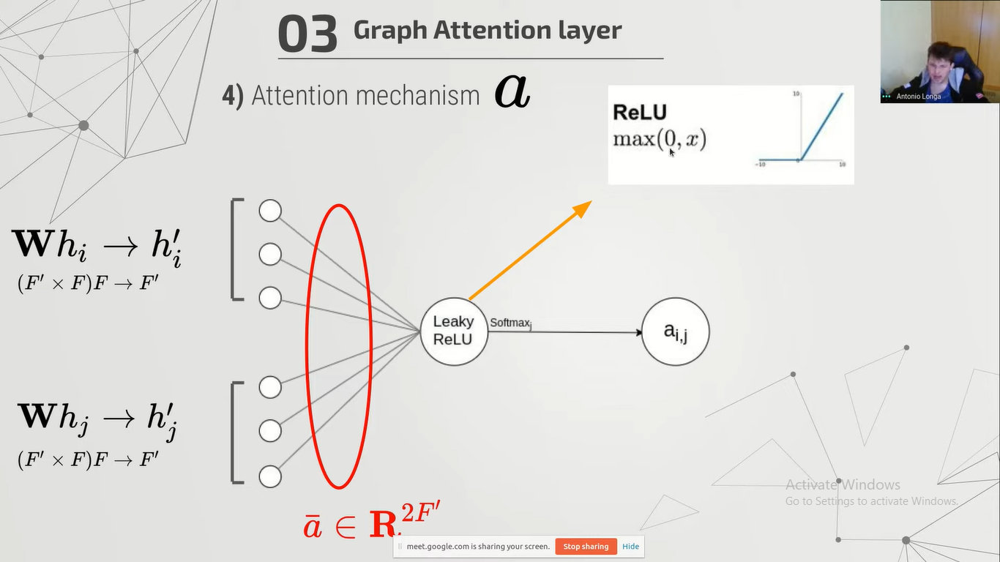

...

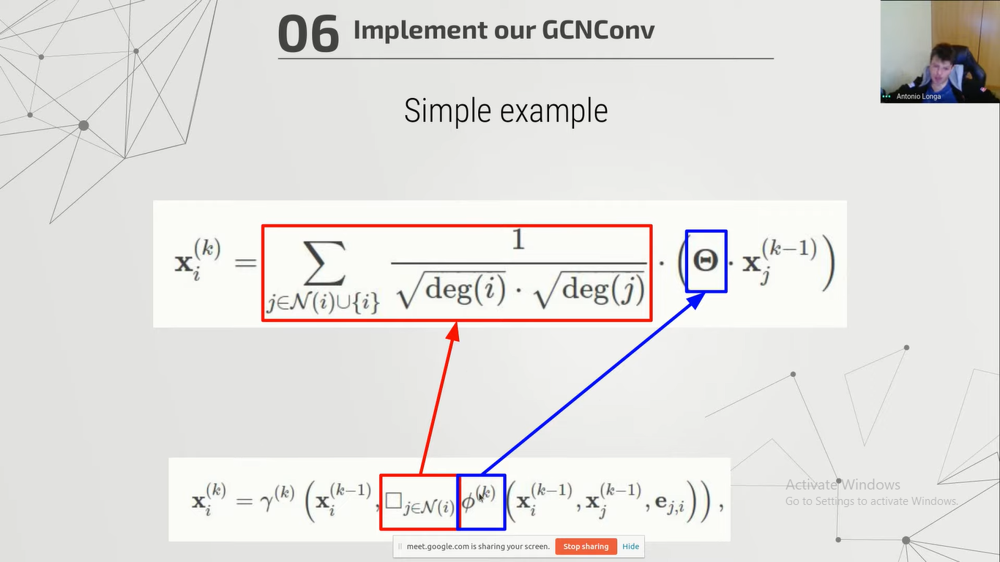

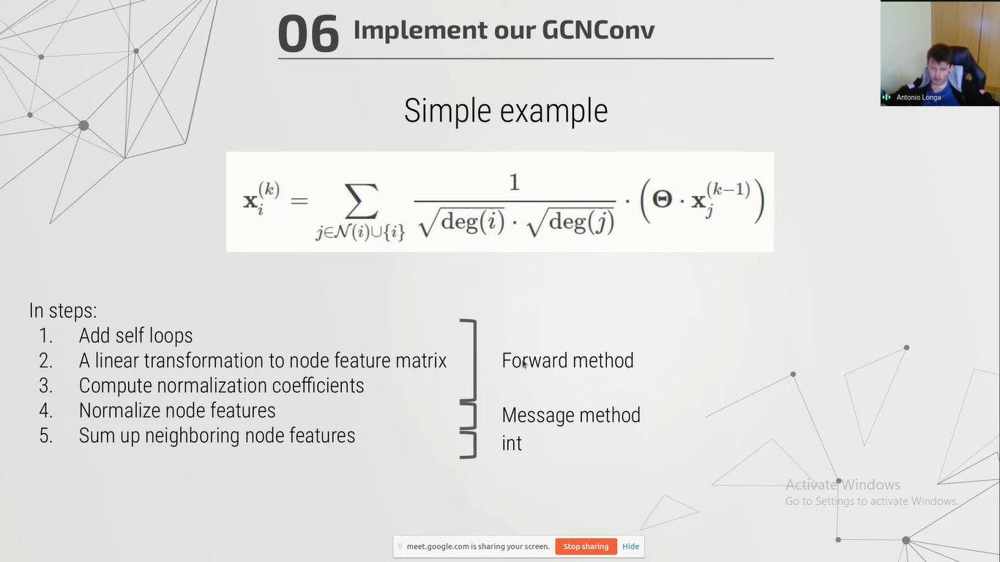

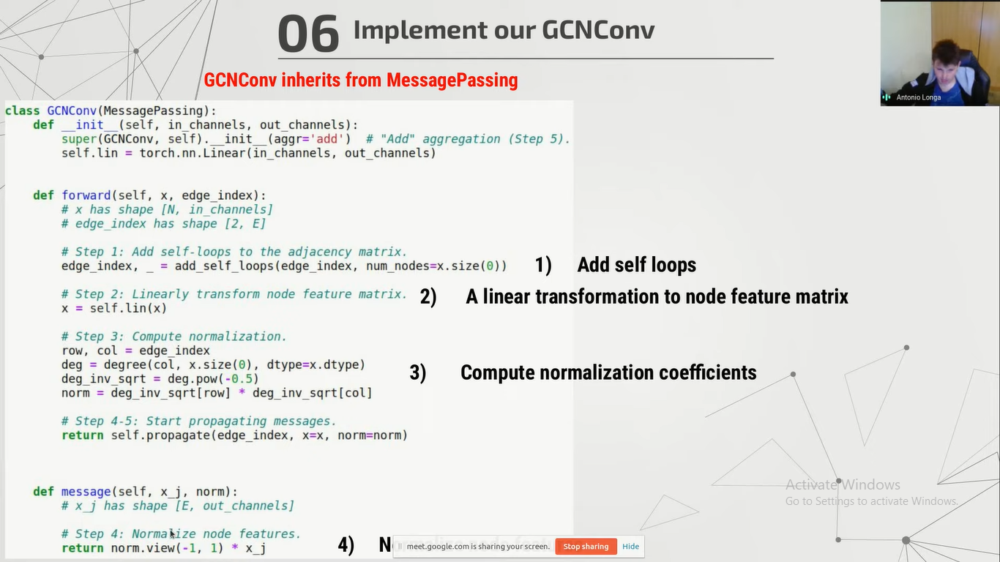

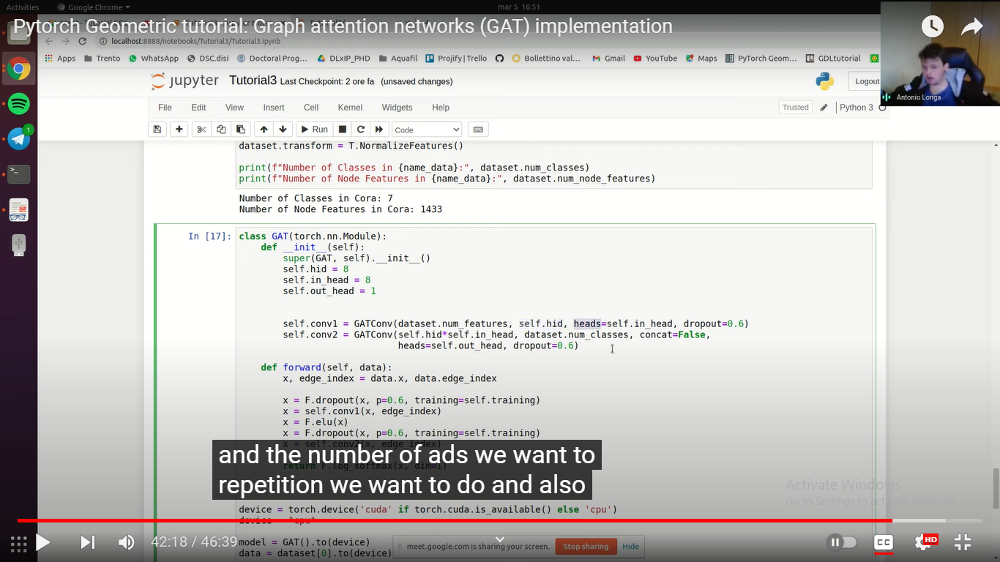

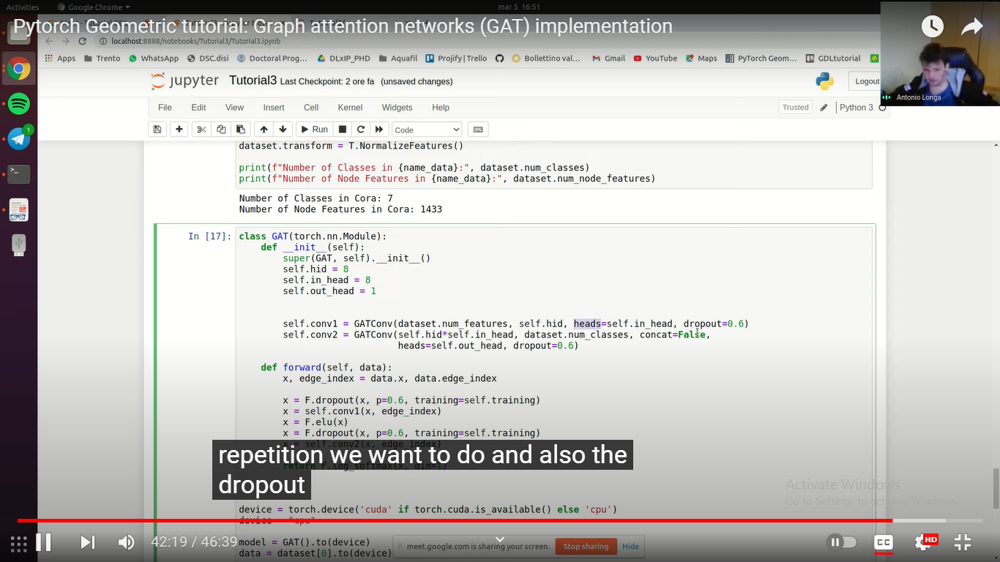

In [ ]:
import torch
import os
!pip install -q torch_geometric
from torch_geometric.datasets import Planetoid
import matplotlib.pyplot as plt
from torch_geometric.nn import GATConv

In [ ]:
from torch_geometric.transforms import NormalizeFeatures
dataset = Planetoid(root = "/content/drive/MyDrive/Urgent/Cora", name = "Cora", transform= NormalizeFeatures())

In [ ]:
print("Number of Classes in: ", dataset.num_classes)
print("Number of Node Features in: ", dataset.num_node_features)

Number of Classes in:  7
Number of Node Features in:  1433


In [ ]:
class GAT(torch.nn.Module):
  def __init__(self):
    super(GAT, self).__init__()
    self.hidden_layer = 8
    self.input_head_attention = 8
    self.output_head_attention = 1

    self.conv1 = GATConv(dataset.num_features, self.hidden_layer, heads=self.input_head_attention, dropout=0.6)
    self.conv2 = GATConv(self.input_head_attention*self.hidden_layer, dataset.num_classes, concat=False,
                         heads= self.output_head_attention, dropout = 0.6)

  def forward(self, data):
    x, edge_index = data.x, data.edge_index
    x = F.dropout(x, p=0.6, training=self.training)
    x = self.conv1(x, edge_index)
    x = F.elu(x) ## Normalization function
    x = F.dropout(x, p=0.6, training=self.training)
    x = self.conv2(x, edge_index)

    return F.log_softmax(x, dim=1)



In [ ]:
import torch.nn.functional as F
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#device = "cpu"

model = GAT().to(device)
data = dataset[0].to(device)


optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)

model.train()
for epoch in range(2000):
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = F.nll_loss(out[data.train_mask], data.y[data.train_mask])

    if epoch%10 == 0:
        print(loss)

    loss.backward()
    optimizer.step()



tensor(1.9490, grad_fn=<NllLossBackward0>)
tensor(1.8796, grad_fn=<NllLossBackward0>)
tensor(1.8059, grad_fn=<NllLossBackward0>)
tensor(1.7046, grad_fn=<NllLossBackward0>)
tensor(1.5642, grad_fn=<NllLossBackward0>)
tensor(1.3658, grad_fn=<NllLossBackward0>)
tensor(1.2203, grad_fn=<NllLossBackward0>)
tensor(1.1377, grad_fn=<NllLossBackward0>)
tensor(1.0949, grad_fn=<NllLossBackward0>)
tensor(1.0097, grad_fn=<NllLossBackward0>)
tensor(0.9190, grad_fn=<NllLossBackward0>)
tensor(0.9585, grad_fn=<NllLossBackward0>)
tensor(0.9146, grad_fn=<NllLossBackward0>)
tensor(0.8274, grad_fn=<NllLossBackward0>)
tensor(0.7799, grad_fn=<NllLossBackward0>)
tensor(0.7699, grad_fn=<NllLossBackward0>)
tensor(0.7796, grad_fn=<NllLossBackward0>)
tensor(0.7129, grad_fn=<NllLossBackward0>)
tensor(0.7422, grad_fn=<NllLossBackward0>)
tensor(0.7504, grad_fn=<NllLossBackward0>)
tensor(0.8075, grad_fn=<NllLossBackward0>)
tensor(0.7005, grad_fn=<NllLossBackward0>)
tensor(0.7140, grad_fn=<NllLossBackward0>)
tensor(0.62

In [ ]:
model.eval()
_, pred = model(data).max(dim=1)
correct = float(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
#.eq() compares the predictions and ground-truth labels element-wise and returns a tensor of boolean values.
#.sum() sums the elements of the tensor.
#.item() converts the tensor to a Python number.
acc = correct / data.test_mask.sum().item()
print('Accuracy: {:.2f}%'.format(acc*100))

Accuracy: 82.40%


[https://colab.research.google.com/github/AntonioLonga/PytorchGeometricTutorial/blob/main/Tutorial3/Tutorial3.ipynb#scrollTo=ovkchsb3boSZ](https://colab.research.google.com/github/AntonioLonga/PytorchGeometricTutorial/blob/main/Tutorial3/Tutorial3.ipynb#scrollTo=ovkchsb3boSZ)